# 1. Data Quality Analysis (DQA)

In [0]:
# The first part of this analysis consist in assesing the quality of the data. 
# In order to obtain this, the following lines of code provide the correponding information.

In [0]:
# First of all, we import the necessary packages for this task. 
import pandas as pd

In [0]:
# Then we read our data into a dataframe. 
census_df=pd.read_csv('https://github.com/ArinB/MSBA-CA-03-Decision-Trees/blob/master/census_data.csv?raw=true')
census_df.head(10)

,hours_per_week_bin,occupation_bin,msr_bin,capital_gl_bin,race_sex_bin,education_num_bin,education_bin,workclass_bin,age_bin,flag,y
0,b. 31-40,b. Mid - Low,b. Mid,c. > 0,c. High,c. 13,c. Bachelors,b. income,d. 36-40 & 56-60,train,0
1,a. 0-30,e. High,c. High,a. = 0,c. High,c. 13,c. Bachelors,b. income,e. 40-55,train,0
2,b. 31-40,a. Low,b. Mid,a. = 0,c. High,b. 9-12,b. Mid,b. income,d. 36-40 & 56-60,train,0
3,b. 31-40,a. Low,c. High,a. = 0,b. Mid,a. 0-8,a. Low,b. income,e. 40-55,train,0
4,b. 31-40,e. High,c. High,a. = 0,a. Low,c. 13,c. Bachelors,b. income,b. 26-30 & 71-100,train,0
5,b. 31-40,e. High,c. High,a. = 0,b. Mid,d. 14,d. Masters,b. income,d. 36-40 & 56-60,train,0
6,a. 0-30,a. Low,b. Mid,a. = 0,a. Low,a. 0-8,a. Low,b. income,e. 40-55,train,0
7,d. 41-50 & 61-70,e. High,c. High,a. = 0,c. High,b. 9-12,b. Mid,b. income,e. 40-55,train,1
8,d. 41-50 & 61-70,e. High,b. Mid,c. > 0,b. Mid,d. 14,d. Masters,b. income,c. 31-35 & 61-70,train,1
9,b. 31-40,e. High,c. High,c. > 0,c. High,c. 13,c. Bachelors,b. income,e. 40-55,train,1


In [0]:
# This line of code describes the data acording to count, mean, std, min, etc. However, since the only numerical column of the data is y, we obtain only one result column. 
census_df.describe()

,y
count,48842.000000
mean,0.239282
std,0.426649
min,0.000000
25%,0.000000
50%,0.000000
75%,0.000000
max,1.000000


In [0]:
# Shape verifies the columns and records of the data. 
census_df.shape

(48842, 11)

In [0]:
# Here, we count how many records are there for each column. 
census_df.count()

hours_per_week_bin    48842
occupation_bin        48842
msr_bin               48842
capital_gl_bin        48842
race_sex_bin          48842
education_num_bin     48842
education_bin         48842
workclass_bin         48842
age_bin               48842
flag                  48842
y                     48842
dtype: int64

In [0]:
# We verify if there is any null values in the data
census_df.isnull().sum()

hours_per_week_bin    0
occupation_bin        0
msr_bin               0
capital_gl_bin        0
race_sex_bin          0
education_num_bin     0
education_bin         0
workclass_bin         0
age_bin               0
flag                  0
y                     0
dtype: int64

In [0]:
# Lastly, we run .info() , verying all the column types. 
census_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48842 entries, 0 to 48841
Data columns (total 11 columns):
hours_per_week_bin    48842 non-null object
occupation_bin        48842 non-null object
msr_bin               48842 non-null object
capital_gl_bin        48842 non-null object
race_sex_bin          48842 non-null object
education_num_bin     48842 non-null object
education_bin         48842 non-null object
workclass_bin         48842 non-null object
age_bin               48842 non-null object
flag                  48842 non-null object
y                     48842 non-null int64
dtypes: int64(1), object(10)
memory usage: 4.1+ MB


# 2. Exploratory Data Analysis (EDA)

In [0]:
# In this section, we perform an exploratory analysis of the data. These graphs will help us to see the distribution of the data. 

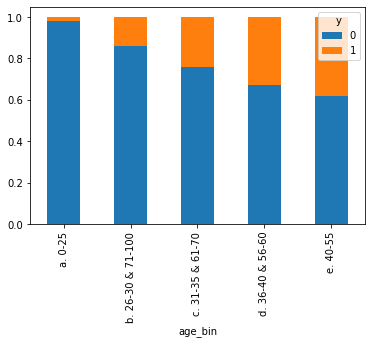

In [0]:
pd.crosstab(census_df['age_bin'],census_df['y'],normalize='index').plot(kind='bar',stacked=True)

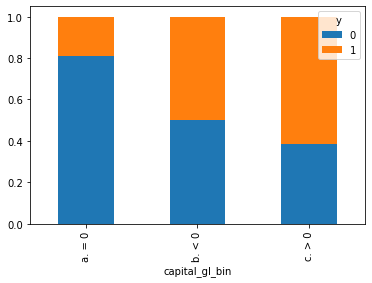

In [0]:
pd.crosstab(census_df['capital_gl_bin'],census_df['y'],normalize='index').plot(kind='bar',stacked=True)

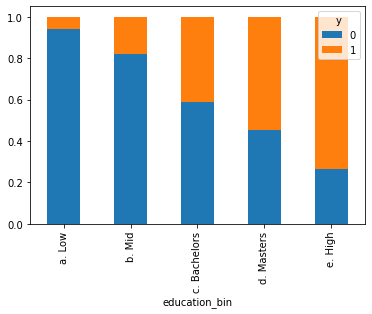

In [0]:
pd.crosstab(census_df['education_bin'],census_df['y'],normalize='index').plot(kind='bar',stacked=True)

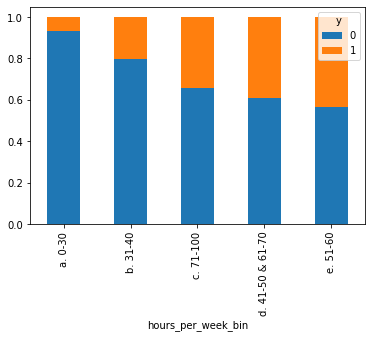

In [0]:
pd.crosstab(census_df['hours_per_week_bin'],census_df['y'],normalize='index').plot(kind='bar',stacked=True)

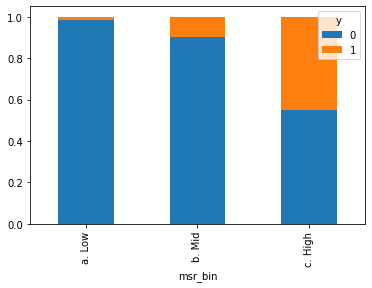

In [0]:
pd.crosstab(census_df['msr_bin'],census_df['y'],normalize='index').plot(kind='bar',stacked=True)

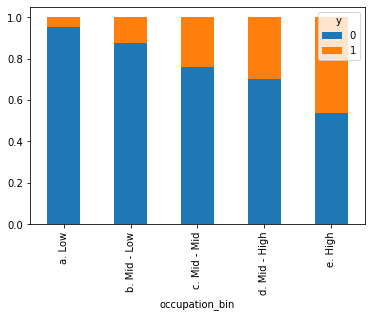

In [0]:
pd.crosstab(census_df['occupation_bin'],census_df['y'],normalize='index').plot(kind='bar',stacked=True)

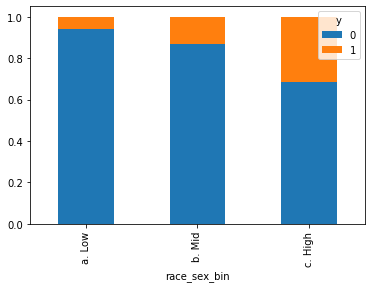

In [0]:
pd.crosstab(census_df['race_sex_bin'],census_df['y'],normalize='index').plot(kind='bar',stacked=True)

# 3. Build Decision Tree Classifier Models

In [0]:
# Now, it's time to build our Decision Tree Model!

In [0]:
# First of all, we install all packages needed, including the ones needed for the performance evaluation. 
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import plot_roc_curve
import matplotlib.pyplot as plt

In [0]:
# Then, we split the data into train set and test set. We do this by making a filter in the column 'flag', which indicates if the record corresponds to train or test. 
train_set=census_df[census_df['flag']=='train']
train_set
test_set=census_df[census_df['flag']=='test']
test_set

,hours_per_week_bin,occupation_bin,msr_bin,capital_gl_bin,race_sex_bin,education_num_bin,education_bin,workclass_bin,age_bin,flag,y
32561,b. 31-40,b. Mid - Low,a. Low,a. = 0,b. Mid,a. 0-8,a. Low,b. income,a. 0-25,test,0
32562,d. 41-50 & 61-70,b. Mid - Low,c. High,a. = 0,c. High,b. 9-12,b. Mid,b. income,d. 36-40 & 56-60,test,0
32563,b. 31-40,d. Mid - High,c. High,a. = 0,c. High,b. 9-12,b. Mid,b. income,b. 26-30 & 71-100,test,1
32564,b. 31-40,b. Mid - Low,c. High,c. > 0,b. Mid,b. 9-12,b. Mid,b. income,e. 40-55,test,1
32565,a. 0-30,b. Mid - Low,a. Low,a. = 0,b. Mid,b. 9-12,b. Mid,a. no income,a. 0-25,test,0
...,...,...,...,...,...,...,...,...,...,...,...
48837,b. 31-40,e. High,b. Mid,a. = 0,b. Mid,c. 13,c. Bachelors,b. income,d. 36-40 & 56-60,test,0
48838,b. 31-40,b. Mid - Low,a. Low,a. = 0,b. Mid,b. 9-12,b. Mid,a. no income,c. 31-35 & 61-70,test,0
48839,d. 41-50 & 61-70,e. High,c. High,a. = 0,c. High,c. 13,c. Bachelors,b. income,d. 36-40 & 56-60,test,0
48840,b. 31-40,b. Mid - Low,a. Low,c. > 0,c. High,c. 13,c. Bachelors,b. income,e. 40-55,test,0


In [0]:
# Now, we proceed to convert our categorical variables into dummies (0s and 1s), in order to be able to run our decision tree algorithm. 

X_train = pd.get_dummies(train_set[['age_bin', 'capital_gl_bin', 'education_bin','hours_per_week_bin', 'msr_bin', 'occupation_bin', 'race_sex_bin','education_num_bin','workclass_bin']],drop_first=True)
y_train=train_set['y']
X_test=pd.get_dummies(test_set[['age_bin', 'capital_gl_bin', 'education_bin','hours_per_week_bin', 'msr_bin', 'occupation_bin', 'race_sex_bin','education_num_bin','workclass_bin']],drop_first=True)
y_test=test_set['y']

In [0]:
# Here, we build our tree, calling the DecisionTreeClassifier method into a variable, fitting our tree and predicting y from the test set. 
dtree=DecisionTreeClassifier(max_depth=10,random_state=101, max_features=None, min_samples_leaf=15)
dtree.fit(X_train,y_train)
y_pred=dtree.predict(X_test)

import timeit
code_to_test = """
a = range(100000)
b = []
for i in a:
    b.append(i*2)
"""
elapsed_time = timeit.timeit(code_to_test, number=100)/100
print(elapsed_time)

0.011575863120001487



#4. Visualize Your Decision Tree using GraphViz

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.889417 to fit



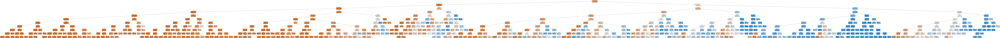

In [0]:
# In order to have a better understanding of the tree, we visualize it. 

from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(dtree, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

#5. Evaluate Decision Tree Performance

In [0]:
# After building our tree, we calculate some scores to assess the performance of our tree.

In [0]:
# The confusion matrix describes how many true prositives, false positives, true negatives and false negative are there in our data. 

df_confusion=confusion_matrix(y_test,y_pred)
print(df_confusion)

[[11521   914]
 [ 1653  2193]]


In [0]:
# Here, we print the accuracy of our model. 

accuracy=accuracy_score(y_test, y_pred)
print("Accuracy:",accuracy)

Accuracy: 0.8423315521159634


In [0]:
# This classification_report function allow us to see indicators such as precision, recall, f1-score and support. 

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.87      0.93      0.90     12435
           1       0.71      0.57      0.63      3846

    accuracy                           0.84     16281
   macro avg       0.79      0.75      0.77     16281
weighted avg       0.83      0.84      0.84     16281



In [0]:
# This score is called "area under the curve" AUC. 

roc_auc_score(y_test, y_pred)

0.7483502983062628

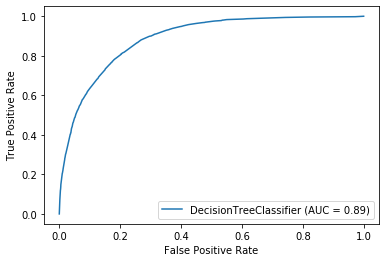

In [0]:
# Here we proceed to visualize our ROC Curve. 

svc_disp = plot_roc_curve(dtree, X_test, y_test)
plt.show()

#6. Tune Decision Tree Performance

In [0]:
# Now we are going to tune our tree with different parameters and build different models to assess which one is the BEST one. 

**GINI IMPURITY**

In [0]:
# For default, the DecisionTreeClassifier uses Gini as the method. 

dtree1=DecisionTreeClassifier(min_samples_split=10,max_depth=10, min_samples_leaf=15)
dtree1.fit(X_train,y_train)
y_pred1=dtree1.predict(X_test)

accuracy1=accuracy_score(y_test, y_pred1)
print('TREE 1')
print("Accuracy:",accuracy1)
print('')
print(classification_report(y_test, y_pred1))

TREE 1
Accuracy: 0.8423315521159634

              precision    recall  f1-score   support

           0       0.87      0.93      0.90     12435
           1       0.71      0.57      0.63      3846

    accuracy                           0.84     16281
   macro avg       0.79      0.75      0.77     16281
weighted avg       0.83      0.84      0.84     16281



In [0]:
dtree2=DecisionTreeClassifier(min_samples_split=3,max_depth=5, min_samples_leaf=5)
dtree2.fit(X_train,y_train)
y_pred2=dtree2.predict(X_test)

accuracy2=accuracy_score(y_test, y_pred2)
print('TREE 2')
print("Accuracy:",accuracy2)
print('')
print(classification_report(y_test, y_pred2))

TREE 2
Accuracy: 0.8282660770222959

              precision    recall  f1-score   support

           0       0.85      0.94      0.89     12435
           1       0.70      0.48      0.57      3846

    accuracy                           0.83     16281
   macro avg       0.78      0.71      0.73     16281
weighted avg       0.82      0.83      0.82     16281



In [0]:
dtree3=DecisionTreeClassifier(min_samples_split=2,max_depth=2, min_samples_leaf=5)
dtree3.fit(X_train,y_train)
y_pred3=dtree3.predict(X_test)

accuracy3=accuracy_score(y_test, y_pred3)
print('TREE 3')
print("Accuracy:",accuracy3)
print('')
print(classification_report(y_test, y_pred3))

TREE 3
Accuracy: 0.8165960321847552

              precision    recall  f1-score   support

           0       0.84      0.95      0.89     12435
           1       0.70      0.40      0.51      3846

    accuracy                           0.82     16281
   macro avg       0.77      0.67      0.70     16281
weighted avg       0.80      0.82      0.80     16281



In [0]:
dtree4=DecisionTreeClassifier(min_samples_split=2,max_depth=10, min_samples_leaf=5)
dtree4.fit(X_train,y_train)
y_pred4=dtree4.predict(X_test)

accuracy4=accuracy_score(y_test, y_pred4)
print('TREE 4')
print("Accuracy:",accuracy4)
print('')
print(classification_report(y_test, y_pred4))

TREE 4
Accuracy: 0.8404889134574043

              precision    recall  f1-score   support

           0       0.87      0.93      0.90     12435
           1       0.70      0.57      0.63      3846

    accuracy                           0.84     16281
   macro avg       0.79      0.75      0.76     16281
weighted avg       0.83      0.84      0.83     16281



**ENTROPY**

In [0]:
# In thi case, we need to add to our model the criterion='entropy' parameter in order to change from gini to entropy method. 

In [0]:
dtree5=DecisionTreeClassifier(criterion='entropy', min_samples_split=2,max_depth=10, min_samples_leaf=15)
dtree5.fit(X_train,y_train)
y_pred5=dtree5.predict(X_test)

accuracy5=accuracy_score(y_test, y_pred5)
print('TREE 5')
print("Accuracy:",accuracy5)
print('')
print(classification_report(y_test, y_pred5))

TREE 5
Accuracy: 0.8425158159818193

              precision    recall  f1-score   support

           0       0.87      0.93      0.90     12435
           1       0.71      0.57      0.63      3846

    accuracy                           0.84     16281
   macro avg       0.79      0.75      0.77     16281
weighted avg       0.83      0.84      0.84     16281



In [0]:
dtree6=DecisionTreeClassifier(criterion='entropy', min_samples_split=5,max_depth=5, min_samples_leaf=20)
dtree6.fit(X_train,y_train)
y_pred6=dtree6.predict(X_test)

accuracy6=accuracy_score(y_test, y_pred6)
print('TREE 6')
print("Accuracy:",accuracy6)
print('')
print(classification_report(y_test, y_pred6))

TREE 6
Accuracy: 0.8278975492905841

              precision    recall  f1-score   support

           0       0.85      0.94      0.89     12435
           1       0.70      0.48      0.57      3846

    accuracy                           0.83     16281
   macro avg       0.77      0.71      0.73     16281
weighted avg       0.82      0.83      0.82     16281



In [0]:
dtree7=DecisionTreeClassifier(criterion='entropy', min_samples_split=2,max_depth=2, min_samples_leaf=5)
dtree7.fit(X_train,y_train)
y_pred7=dtree7.predict(X_test)

accuracy7=accuracy_score(y_test, y_pred7)
print('TREE 7')
print("Accuracy:",accuracy7)
print('')
print(classification_report(y_test, y_pred7))

TREE 7
Accuracy: 0.8165960321847552

              precision    recall  f1-score   support

           0       0.84      0.95      0.89     12435
           1       0.70      0.40      0.51      3846

    accuracy                           0.82     16281
   macro avg       0.77      0.67      0.70     16281
weighted avg       0.80      0.82      0.80     16281



In [0]:
dtree8=DecisionTreeClassifier(criterion='entropy',min_samples_split=2,max_depth=10, min_samples_leaf=5)
dtree8.fit(X_train,y_train)
y_pred8=dtree8.predict(X_test)

accuracy8=accuracy_score(y_test, y_pred8)
print('TREE 8')
print("Accuracy:",accuracy8)
print('')
print(classification_report(y_test, y_pred8))

TREE 8
Accuracy: 0.8400589644370738

              precision    recall  f1-score   support

           0       0.87      0.92      0.90     12435
           1       0.70      0.57      0.63      3846

    accuracy                           0.84     16281
   macro avg       0.79      0.75      0.76     16281
weighted avg       0.83      0.84      0.83     16281



dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.839297 to fit



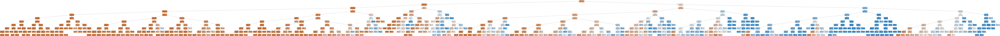

In [0]:
# Now, we choose our best tree, which is number 5, and we proceed to visualize our tree. 
dot_data = StringIO()
export_graphviz(dtree5, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

#7. Automation of Performance Tuning

In [0]:
# Now, we are going to make the process of tuning our tree a little bit easier. We are going to create an excel file wich contains the data of the parameters, read that csv file into a dataframe and the make a for loop to iterate through the parameters and print performance scores for each tree. 

In [0]:
performance_tuning_df=pd.read_csv('Table_for_CA03.csv')
performance_tuning_df

,Split Criteria (Entropy or Gini),Minimum Sample Split,Minimum Sample Leaf,Maximum Depth
0,Entropy,10,15,10
1,Entropy,5,20,5
2,Entropy,2,5,2
3,Entropy,2,5,10
4,Gini Impurity,10,15,10
5,Gini Impurity,3,5,5
6,Gini Impurity,2,5,2
7,Gini Impurity,2,5,10


In [0]:

for i in range(len(performance_tuning_df)):
  if performance_tuning_df['Split Criteria (Entropy or Gini)'][i] == 'Entropy':

    dtree=DecisionTreeClassifier(criterion='entropy', min_samples_split=performance_tuning_df['Minimum Sample Split'][i],max_depth=performance_tuning_df['Maximum Depth'][i], min_samples_leaf=performance_tuning_df['Minimum Sample Leaf'][i])
    dtree.fit(X_train,y_train)
    y_pred=dtree.predict(X_test)
    print('Criteria: ENTROPY')
    accuracy=accuracy_score(y_test, y_pred)
    print("Accuracy:",accuracy)

    print(classification_report(y_test, y_pred))
    print('----------------------------------------------------------')
  else:

    dtree=DecisionTreeClassifier(min_samples_split=performance_tuning_df['Minimum Sample Split'][i],max_depth=performance_tuning_df['Maximum Depth'][i], min_samples_leaf=performance_tuning_df['Minimum Sample Leaf'][i])
    dtree.fit(X_train,y_train)
    y_pred=dtree.predict(X_test)
    print('Criteria: GINI')
    accuracy=accuracy_score(y_test, y_pred)
    print("Accuracy:",accuracy)

    print(classification_report(y_test, y_pred))
    print('----------------------------------------------------------')

Criteria: ENTROPY
Accuracy: 0.8425158159818193
              precision    recall  f1-score   support

           0       0.87      0.93      0.90     12435
           1       0.71      0.57      0.63      3846

    accuracy                           0.84     16281
   macro avg       0.79      0.75      0.77     16281
weighted avg       0.83      0.84      0.84     16281

----------------------------------------------------------
Criteria: ENTROPY
Accuracy: 0.8278975492905841
              precision    recall  f1-score   support

           0       0.85      0.94      0.89     12435
           1       0.70      0.48      0.57      3846

    accuracy                           0.83     16281
   macro avg       0.77      0.71      0.73     16281
weighted avg       0.82      0.83      0.82     16281

----------------------------------------------------------
Criteria: ENTROPY
Accuracy: 0.8165960321847552
              precision    recall  f1-score   support

           0       0.84      0.9

#8. Prediction using your “trained” Decision Tree Model

In [0]:
# Lastly, we crate a new dataframe, in this case called "df", and insert the values 0s and 1s according to what we want to predict. 

In [0]:
df=pd.DataFrame({'age_bin_b. 26-30 & 71-100':0,'age_bin_c. 31-35 & 61-70':0,'age_bin_d. 36-40 & 56-60':1,'age_bin_e. 40-55':0,'capital_gl_bin_b. < 0':0,'capital_gl_bin_c. > 0':1,'education_bin_b. Mid':0,'education_bin_c. Bachelors':0,'education_bin_d. Masters':0,'education_bin_e. High':1,'hours_per_week_bin_b. 31-40':0,'hours_per_week_bin_c. 71-100':0,'hours_per_week_bin_d. 41-50 & 61-70':1,'hours_per_week_bin_e. 51-60':0,'msr_bin_b. Mid':0,'msr_bin_c. High':1,'occupation_bin_b. Mid - Low':1,'occupation_bin_c. Mid - Mid':0,'occupation_bin_d. Mid - High':0,'occupation_bin_e. High':0,'race_sex_bin_b. Mid':1,'race_sex_bin_c. High':0,'education_num_bin_b. 9-12':1,'education_num_bin_c. 13':0,'education_num_bin_d. 14':0,'education_num_bin_e. 15+':0,'workclass_bin_b. income':1},index=[0])
df

,age_bin_b. 26-30 & 71-100,age_bin_c. 31-35 & 61-70,age_bin_d. 36-40 & 56-60,age_bin_e. 40-55,capital_gl_bin_b. < 0,capital_gl_bin_c. > 0,education_bin_b. Mid,education_bin_c. Bachelors,education_bin_d. Masters,education_bin_e. High,hours_per_week_bin_b. 31-40,hours_per_week_bin_c. 71-100,hours_per_week_bin_d. 41-50 & 61-70,hours_per_week_bin_e. 51-60,msr_bin_b. Mid,msr_bin_c. High,occupation_bin_b. Mid - Low,occupation_bin_c. Mid - Mid,occupation_bin_d. Mid - High,occupation_bin_e. High,race_sex_bin_b. Mid,race_sex_bin_c. High,education_num_bin_b. 9-12,education_num_bin_c. 13,education_num_bin_d. 14,education_num_bin_e. 15+,workclass_bin_b. income
0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,1,1,0,0,0,1,0,1,0,0,0,1


In [0]:
# Then, we proceed to run our Decision Tree algorithmm. However, this time, instead of using the "X_test" to predict, we use the new dataframe "df".

In [0]:
dtree=DecisionTreeClassifier(criterion='entropy', min_samples_split=2,max_depth=10, min_samples_leaf=15)
dtree.fit(X_train,y_train)
y_pred=dtree.predict(df)
print(y_pred)
if y_pred == 0:
  print('The income for this type of person is equal or below 50k.')
else:
  print('The income for this type of person is higher than 50k.')

[0]
The income for this type of person is equal or below 50k.


In [0]:
# The result is 0, which means the income for this type of person is less than or equal to 50k. 